In [1]:
True ==1

True

## Dictionaries

In [35]:
d = {'a':1, 'b':2}

In [37]:
print( d.get('c') )

None


In [38]:
d['c']

KeyError: 'c'

## global and non-local

In [43]:
a = 111

def f():
    
    global a
    
    a = 222 
    
    b = 777
    
    def g():
        
        #SyntaxError: no binding for nonlocal 'a' found
        #nonlocal a  
        global a
        a = 333
        
        nonlocal b
        b=888
        
    g()
    print(b)
    
f()
    
print(a)

888
333


## Class body

In [ ]:
class Person:
    print('hi!')
    def f():
        print('hohohoho')

## IDs and references

In [44]:
a = [1,2,3]

id(a[0])

140736021897616

In [47]:
id(a[1])

140736021897648

In [46]:
id(a)

2863045805512

In [48]:
import sys
a = [1,2,3]

sys.getrefcount(a)

2

In [49]:
del a
sys.getrefcount(a)

NameError: name 'a' is not defined

# Descriptors

## 1st Try (PROBLEM)

In [1]:
class IntegerValue:
    '''
    DESCRIPTOR
    '''
    def __init__(self, value=None):
        print('__init__ IntegerValue Instance')
        if value:
            self.set(value)  
    def get(self):
        print('calling get')
        return self._value
    def set(self, value):
        print('calling set')
        self._value = int(value)
    

class Point2D:
    x = IntegerValue()
    y = IntegerValue()
    

__init__ IntegerValue Instance
__init__ IntegerValue Instance


In [2]:
p = Point2D()

In [3]:
p.x = 10

In [4]:
p.__dict__

{'x': 10}

In [5]:
type(p.x)  # it shadowed class attribute!!

int

In [6]:
p2 = Point2D()
p2.x

In [7]:
type(p2.x)

__main__.IntegerValue

In [9]:
p2.x.set(10)
p2.x.get()

calling set
calling get


10

In [11]:
p2.y.set(20)
p2.y.get()

calling set
calling get


20

In [13]:
p3 = Point2D()

In [14]:
p3.x.get()  # PROBLEM: IntegerValue instances are BOUND to class NOT instace...

calling get


10

In [15]:
p3.x.set(111)
p3.x.get()

calling set
calling get


111

In [16]:
p2.x.get()  # It is no longer 10! They are sharing this class attribute!!!

calling get


111

## 2nd try (PROBLEM)

In [18]:
class IntegerValue:
    '''
    DESCRIPTOR
    '''
    def __init__(self, value=None):
        print('__init__ IntegerValue Instance')
        if value:
            self.set(value)  
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if not instance:
            return self
        return self._value
    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')
        self._value = int(value)
    

class Point2D:
    x = IntegerValue()
    y = IntegerValue()

__init__ IntegerValue Instance
__init__ IntegerValue Instance


In [20]:
p = Point2D()
p.x = 10

calling set
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994F89FC8>


In [21]:
p.x

calling get
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994F89FC8>, owner_class=<class '__main__.Point2D'>


10

In [22]:
p2 = Point2D()
p2.x   # PROBLEM: attribute x is shared by all instances!!!

calling get
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994578B08>, owner_class=<class '__main__.Point2D'>


10

In [23]:
p2.x = 22
p2.x

calling set
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994578B08>
calling get
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994578B08>, owner_class=<class '__main__.Point2D'>


22

In [24]:
p.x  

calling get
self=<__main__.IntegerValue object at 0x0000026994FBA508>, instance=<__main__.Point2D object at 0x0000026994F89FC8>, owner_class=<class '__main__.Point2D'>


22

## 3rd try (progress but still PROBLEM)

#### Storing it as instance attribute. 

- It solves the problem that is no longer shared with other class attributes

#### Problems:
- Doens't work with multiple descriptor instances!
- It may override instance attribute
- doesn't work with slots (cannot add 'stored_value' in instance dict unless we specify that in slots in Point2D)

In [29]:
class IntegerValue:
    '''
    DESCRIPTOR
    '''
            
    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        instance.stored_value = int(value)
        
        # previous
        #self._value = int(value) 
            
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        return getattr(instance, 'stored_value', None)
        
        # previous
        #return self._value
    
    

class Point2D:
    x = IntegerValue()
    y = IntegerValue()

In [30]:
p = Point2D()
p.x = 11

calling set
self=<__main__.IntegerValue object at 0x0000026994FC1908>, instance=<__main__.Point2D object at 0x0000026994FC4C48>


In [31]:
p.x

calling get
self=<__main__.IntegerValue object at 0x0000026994FC1908>, instance=<__main__.Point2D object at 0x0000026994FC4C48>, owner_class=<class '__main__.Point2D'>


11

In [32]:
p.__dict__

{'stored_value': 11}

In [34]:
p2 = Point2D()
p2.x = 22

calling set
self=<__main__.IntegerValue object at 0x0000026994FC1908>, instance=<__main__.Point2D object at 0x0000026994FBD988>


In [35]:
p2.x

calling get
self=<__main__.IntegerValue object at 0x0000026994FC1908>, instance=<__main__.Point2D object at 0x0000026994FBD988>, owner_class=<class '__main__.Point2D'>


22

In [36]:
p2.__dict__

{'stored_value': 22}

In [38]:
p.__dict__

{'stored_value': 11}

#### It seems like it worked, but the problem is that if we create 2 instances of descriptor:
x = IntegerValue() <br>
y = IntegerValue() <br>
then code will break:

In [39]:
p.y = 33

calling set
self=<__main__.IntegerValue object at 0x0000026994FC1988>, instance=<__main__.Point2D object at 0x0000026994FC4C48>


In [40]:
p.y

calling get
self=<__main__.IntegerValue object at 0x0000026994FC1988>, instance=<__main__.Point2D object at 0x0000026994FC4C48>, owner_class=<class '__main__.Point2D'>


33

#### PROBLEM is that attribute 'stored_value' is shared between different descriptor instances!

In [41]:
p.__dict__  

{'stored_value': 33}

## 4th try (small PROBLEM)

### Give a name to each instance descriptor at creation, and make instance aware of this

#### Problems:
- we have to give as input the names that we want for attributes. Like 'x' or 'y'
- We assume '_x' and '_y' is not used already but the user in the class
- doesn't work with slots. If Point2D implemented slots, then we couldn't just add '_x' and '_y' in the instance dictionary, unless we specify that in the slots

In [1]:
class IntegerValue:
    '''
    DESCRIPTOR
    ''' 
    def __init__(self, name):  # We are giving each attribute a separate name!
        self.storage_name = '_' + name
            
    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        # we cannot say instance.self.stored_value = int(value). 
        # Use setattr:
        
        setattr(instance, self.storage_name, int(value))
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        #previous
        #return getattr(instance, 'stored_value', None)
        
        return getattr(instance, self.storage_name, None)
    
    

class Point2D:
    x = IntegerValue('x')  # notice the input 'x' now that contributes to naming 
    y = IntegerValue('y')

In [4]:
p = Point2D()
p.x = 10
p.y = 11

calling set
self=<__main__.IntegerValue object at 0x000001EC9BE09548>, instance=<__main__.Point2D object at 0x000001EC9BE26388>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BE09648>, instance=<__main__.Point2D object at 0x000001EC9BE26388>


In [5]:
p.__dict__

{'_x': 10, '_y': 11}

In [7]:
p2 = Point2D()
p2.x = 22
p2.y = 23

calling set
self=<__main__.IntegerValue object at 0x000001EC9BE09548>, instance=<__main__.Point2D object at 0x000001EC9BEA20C8>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BE09648>, instance=<__main__.Point2D object at 0x000001EC9BEA20C8>


In [8]:
p2.__dict__

{'_x': 22, '_y': 23}

In [10]:
p.__dict__

{'_x': 10, '_y': 11}

#### the problem is the following:

In [11]:
p3 = Point2D()
p3._x = 777

In [12]:
# Overriden!

p3.x = 121212
p3.__dict__

calling set
self=<__main__.IntegerValue object at 0x000001EC9BE09548>, instance=<__main__.Point2D object at 0x000001EC9BEA5BC8>


{'_x': 121212}

## 5th try (kinda WORKS but assumes hashable instances of Point2D)

#### Instead of trying to store something on the instance (which if it is slotted they we cannot store) we can create storage inside the descriptor which can be instance specific

- fixes slot issue pon the instance, but still assumes class is hashable. If you define dunder eq you need to define dunder hash also!
- memory leaks!!

In [29]:
class IntegerValue:
    '''
    DESCRIPTOR
    ''' 
    def __init__(self):  # We are giving each attribute a separate name!
        #self.storage_name = '_' + name
        self.values = {}
        # we don't have to worry about the name of the property
        # since x and y are different descriptors, will have different values {} dict
            
    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        #setattr(instance, self.storage_name, int(value))
        
        # Create instance specific storage! Different instance of Point2D will have different storage
        self.values[instance] = int(value)    #here we assume instance is hashable!
    
        
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        #previous
        #return getattr(instance, self.storage_name, None)
        
        return self.values.get(instance)  # It returns None if we do get before set
        # self.values
    
    

class Point2D:
    #x = IntegerValue('x') 
    #y = IntegerValue('y')
    
    x = IntegerValue() 
    y = IntegerValue()

In [16]:
p = Point2D()
p2 = Point2D()

In [22]:
p.x = 10
p.y = 11

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=<__main__.Point2D object at 0x000001EC9BEAED48>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BEAE2C8>, instance=<__main__.Point2D object at 0x000001EC9BEAED48>


In [23]:
p2.x = 22
p2.y = 23

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=<__main__.Point2D object at 0x000001EC9BEAED08>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BEAE2C8>, instance=<__main__.Point2D object at 0x000001EC9BEAED08>


In [24]:
p.x, p.y

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=<__main__.Point2D object at 0x000001EC9BEAED48>, owner_class=<class '__main__.Point2D'>
calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE2C8>, instance=<__main__.Point2D object at 0x000001EC9BEAED48>, owner_class=<class '__main__.Point2D'>


(10, 11)

In [25]:
p2.x, p2.y

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=<__main__.Point2D object at 0x000001EC9BEAED08>, owner_class=<class '__main__.Point2D'>
calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE2C8>, instance=<__main__.Point2D object at 0x000001EC9BEAED08>, owner_class=<class '__main__.Point2D'>


(22, 23)

#### take a look at the dictionary

In [26]:
Point2D.x  #returns the descriptor!

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=None, owner_class=<class '__main__.Point2D'>


In [27]:
Point2D.x.values

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE208>, instance=None, owner_class=<class '__main__.Point2D'>


{<__main__.Point2D at 0x1ec9beaed48>: 10,
 <__main__.Point2D at 0x1ec9beaed08>: 22}

In [28]:
Point2D.y.values

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEAE2C8>, instance=None, owner_class=<class '__main__.Point2D'>


{<__main__.Point2D at 0x1ec9beaed48>: 11,
 <__main__.Point2D at 0x1ec9beaed08>: 23}

#### Problem we have more than 1 references to the objects that p1 and p2 point to (because we use them as keys in the descriptor) Hence if we delete p1 and p2 the underlying object will still be there!!!

## 6th try Using WEAK references!
### Instead of storing the object as a key, store a weak reference to the object in the dictionary keys. Create a dictionary of weak reference (for our keys) for our data descriptor
 - weakred does NOT count in the reference count. 
 - When strong reference count (from ctypes) goes to zero then the object is destroyed
 - NO memory leaks
 - NO need to store data in the instances themsleves which may be sloted (solving slots problem)

### Problems:
- objects stored as keys in the dictinary should be HASHABLE!!  
- many build in types do NOT support weakref (int, string, list, dictionaries)

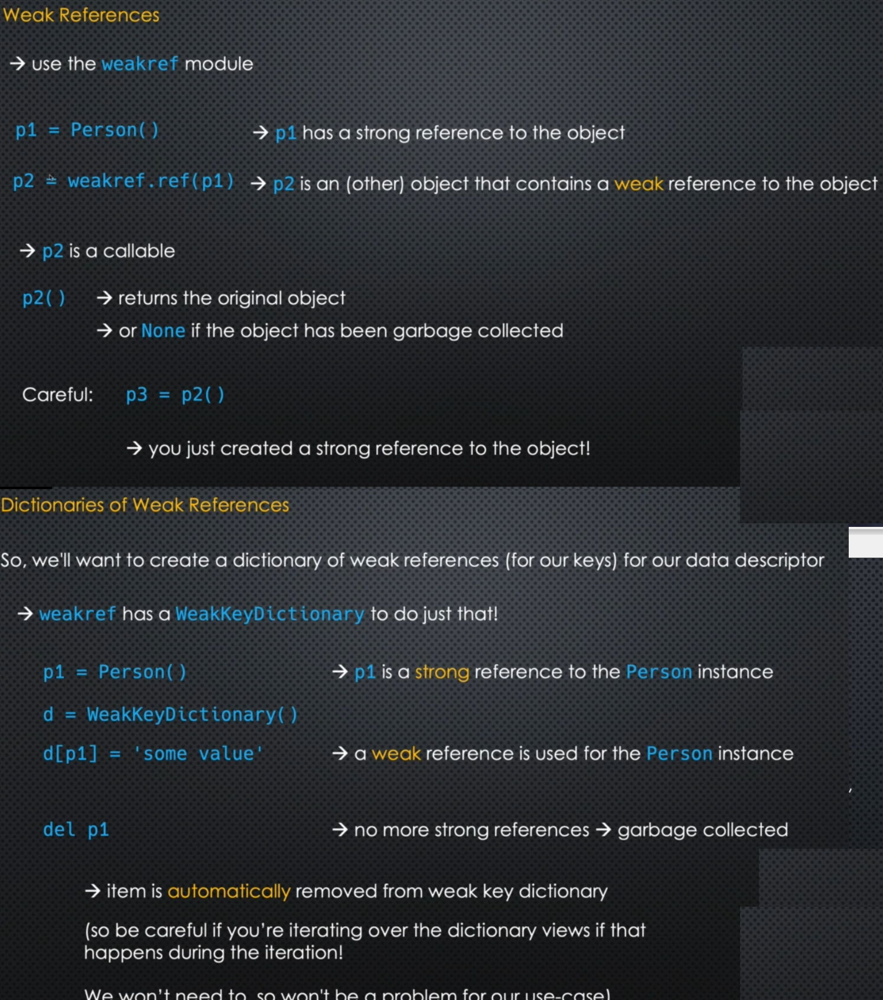

In [89]:
import weakref

class IntegerValue:
    '''
    DESCRIPTOR
    ''' 
    def __init__(self):  # We are giving each attribute a separate name!
        #self.storage_name = '_' + name
        #self.values = {}
        self.values = weakref.WeakKeyDictionary()  # keys are weak references to objects now!!!
            
    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        #setattr(instance, self.storage_name, int(value))
        
        self.values[instance] = int(value)    #here we assume instance is hashable!
        # get a weakref to instance
        # this assumes that the instnace is hashable and that you can have a weakref to it!
        
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        #previous
        #return getattr(instance, self.storage_name, None)
        
        return self.values.get(instance)  # It returns None if we do get before set
        # self.values
    
    

class Point2D:
    #x = IntegerValue('x') 
    #y = IntegerValue('y')
    
    x = IntegerValue() 
    y = IntegerValue()

In [97]:
p = Point2D()
p.x=10

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEC5A48>, instance=<__main__.Point2D object at 0x000001EC9BECD608>


In [98]:
Point2D.x.values.keyrefs()

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEC5A48>, instance=None, owner_class=<class '__main__.Point2D'>


[<weakref at 0x000001EC9BEE7CC8; to 'Point2D' at 0x000001EC9BECD608>]

In [99]:
del p

In [100]:
Point2D.x.values.keyrefs()

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEC5A48>, instance=None, owner_class=<class '__main__.Point2D'>


[]

## WEAK REFERENCES

In [31]:
import weakref
import ctypes

def ref_count(address : int):
    return ctypes.c_long.from_address(address).value

In [58]:
class Person:
    pass

p1 = Person()

In [59]:
d1 = weakref.WeakKeyDictionary()
d2 = weakref.WeakKeyDictionary()

In [60]:
d1[p1] = 'Theo'
ref_count(id(p1)) , weakref.getweakrefcount(p1)

(1, 1)

In [61]:
d2[p1] = 'Rallou'
ref_count(id(p1)) , weakref.getweakrefcount(p1)

(1, 2)

In [62]:
p1.__weakref__  # double-linked list!

<weakref at 0x000001EC9BEC1318; to 'Person' at 0x000001EC9BEBF108>

In [63]:
d1.keyrefs()

[<weakref at 0x000001EC9BE227C8; to 'Person' at 0x000001EC9BEBF108>]

In [64]:
d2.keyrefs()

[<weakref at 0x000001EC9BEC1318; to 'Person' at 0x000001EC9BEBF108>]

In [65]:
hash(p1)  #HASHABLE OBJECT

-9223371904621035760

In [66]:
del p1

In [67]:
d1.keyrefs()

[]

## HASHABLE

#### It cannot go into the dictionary if it is unhashable!!!

In [83]:
class Person:
    def __init__(self, name):
        self.name = name
        
    def __eq__(self, other):
        return isinstance(other, Person) and self.name == other.name
    
    
p  = Person('Theo')
hash(p)

TypeError: unhashable type: 'Person'

In [84]:
d1[p] = 'stored'

TypeError: unhashable type: 'Person'

In [85]:
class Person:
    def __init__(self, name):
        self.name = name
        
    def __eq__(self, other):
        return isinstance(other, Person) and self.name == other.name
    
    def __hash__(self):  # Usually what we are using for comparison, use for the hash
        # make a tuple if necessary
        return hash(self.name)
    
p  = Person('Theo')
hash(p)

4274029789204457732

### Now that is hashable you can use it as keys to the dictionary!!!

In [86]:
p2 = Person('Georgia')

In [87]:
d1[p] = 'stored1'
d1[p2] = 'stored2'
d1.keyrefs()

[<weakref at 0x000001EC9BEE2138; to 'Person' at 0x000001EC9BEA2988>,
 <weakref at 0x000001EC9BEE2228; to 'Person' at 0x000001EC9BEA2A08>]

## WeakKeyDictionaries in data descriptors work only with hashable objects!!! 

## Moreover the keys that you store should be able to have a weakref (e.g. custom objects, but not primitive types!)

In [88]:
d1

# 7th try 

### The previous approach had the drawback that the objects should be hashable in order to be used as keys in the WeakKeyDictionary!! Moreover some primitive objects do not support weakrefs!

### In this approach we use id(instance) as a key (always hashable!)

### Pros:
- works for non HASHABLE objects since we store the ID and not the instance itself
- still not storing strong ref to dictionary as in 6th

### Problems:
- if the object is finalized and garbage collected, the corresponding entry still remains in the dictionary. The data dictioanry may contain id of instances that no longer exist and there is also a chance that the id itself is re-used. That was the big advantage on WeakKeyDictionary!!!


In [103]:
import weakref

class IntegerValue:
    '''
    DESCRIPTOR
    ''' 
    def __init__(self):  # We are giving each attribute a separate name!
        #self.storage_name = '_' + name
        self.values = {}

    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        #setattr(instance, self.storage_name, int(value))
        
        self.values[id(instance)] = int(value)    #here we assume instance is hashable!
        # get a weakref to instance
        # this assumes that the instnace is hashable and that you can have a weakref to it!
        
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        #previous
        #return getattr(instance, self.storage_name, None)
        
        return self.values.get(id(instance))  # It returns None if we do get before set
        # self.values
    
    

class Point2D:
    '''
    NO LONGER HASHABLE!!
    '''

    x = IntegerValue() 
    y = IntegerValue()
    
    def __init__(self, x, y):
        self.x = x
        self.y = y
        
    def __eq__(self, other):
        return isinstance(other, Point2D) and self.x ==other.x and self.y == other.y
    

In [104]:
p = Point2D(10,11)

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=<__main__.Point2D object at 0x000001EC9BECD9C8>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF0C8>, instance=<__main__.Point2D object at 0x000001EC9BECD9C8>


In [105]:
Point2D.x

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=None, owner_class=<class '__main__.Point2D'>


In [106]:
Point2D.x.values  # No memory leaks

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=None, owner_class=<class '__main__.Point2D'>


{2115739900360: 10}

In [107]:
id(p)

2115739900360

In [108]:
del p

In [109]:
ref_count(2115739900360)

-1802527080

In [110]:
Point2D.x.values  # still maintain the keys....

calling get
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=None, owner_class=<class '__main__.Point2D'>


{2115739900360: 10}

# 8th try  (FINALLY!!!)

### use weakref.ref: it provides a callback functionality when the object is finalized!
### use if(instance) as key instead of the instance itself (solved slots problem)
- Use id(instance) as a key
- use (weak_ref, value) as dictionary value
    - for each 

## SOLVES:
- hashability problem: we now store the id and not the instance as key

- Handle classes that hav slots!

- If Person object uses slots then we cannot create weakrefs to person instances, because the `__weakref__` and `__dict__` will be overriden with slots. solution: 
    - `__slots__` = 'name', `'__weakref__'`
    
    
#### problem:

- since we are using weakref on instance, it cannot be a weakref to string, list, etc...


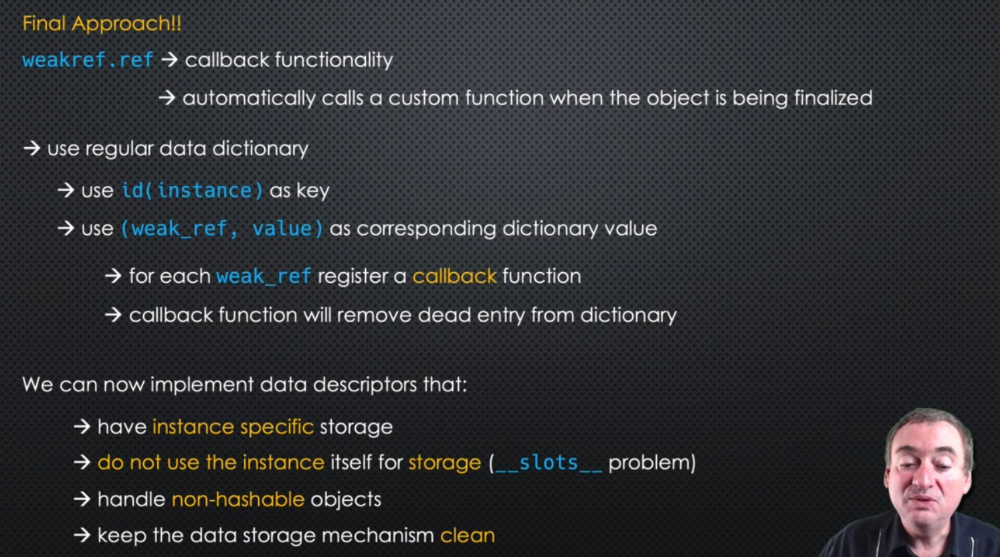

## Weakrefs are aware of when objects are destroyed!!!

In [112]:
p = Point2D(10,11)

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=<__main__.Point2D object at 0x000001EC9BEA2AC8>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF0C8>, instance=<__main__.Point2D object at 0x000001EC9BEA2AC8>


In [113]:
weak_p = weakref.ref(p)

In [114]:
weak_p

<weakref at 0x000001EC9BEE2EF8; to 'Point2D' at 0x000001EC9BEA2AC8>

In [115]:
ref_count(id(p))

1

In [116]:
del p

### Weakref was informed that the object was destroyed
### specify additional parameter for callback function

In [117]:
weak_p

<weakref at 0x000001EC9BEE2EF8; dead>

### HOOK into the garbage collection cycle!

In [121]:
def obj_destroyed(obj):
    '''
    it receives the weakref object, not the object that has being destroyed
    '''
    print(f'{obj} is being destroyed')

In [122]:
p = Point2D(10,11)
weak_p = weakref.ref(p, obj_destroyed)

calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF708>, instance=<__main__.Point2D object at 0x000001EC9BEF0148>
calling set
self=<__main__.IntegerValue object at 0x000001EC9BEBF0C8>, instance=<__main__.Point2D object at 0x000001EC9BEF0148>


In [123]:
del p

<weakref at 0x000001EC9BEF3B38; dead> is being destroyed


In [ ]:
import weakref

class IntegerValue:
    '''
    DESCRIPTOR
    ''' 
    def __init__(self):  # We are giving each attribute a separate name!
        #self.storage_name = '_' + name
        self.values = {}

    def __set__(self, instance, value):
        print('calling set')
        print(f'self={self}, instance={instance}')

        #setattr(instance, self.storage_name, int(value))
        
        self.values[id(instance)] = ( weakref.ref(instance, self._remove_object) , int(value) )    #here we assume instance is hashable!
        # get a weakref to instance
        # this assumes that the instnace is hashable and that you can have a weakref to it!
        
            
    def __get__(self, instance, owner_class):
        '''
        self: is instance of IntegerValue
        instance: is either point instance or None if called from class
        owner_class: is Point2D is both cases
        '''
        print('calling get')
        print(f'self={self}, instance={instance}, owner_class={owner_class}')
        if instance is None:
            return self
        #previous
        #return getattr(instance, self.storage_name, None)
        value_tuple = self.values.get(id(instance))
        return value_tuple[1] # It returns None if we do get before set
        # self.values
    
    def _remove_object(self, weak_ref):
        print(f'removing dead entry for weakref={weak_ref}')
        
        for key, value in self.values.items():
            if value[0] is weak_ref:
                del self.values[key]
                break
                
        # or another way to do the same thing:
    

class Point2D:
    '''
    NO LONGER HASHABLE!!
    '''


    x = IntegerValue() 
    y = IntegerValue()
    
    def __init__(self, x, y):
        self.x = x
        self.y = y
        
    def __eq__(self, other):
        return isinstance(other, Point2D) and self.x ==other.x and self.y == other.y
    
    
class Person:
    __slots__ = 'name', '__weakref__'
    

### Each object has an attribute of `__weakref__`

In [ ]:
## If Person object uses slots then we canno

##  9th try (OK!) 

### Use instance dictionary to store the data (instead of data dictionary inside the descriptor)using `__set_name__` python>=3.6

 when we say `x = IntegerValue()` in the Point2D then if the IntegerValue descriptor implements the `__set_name__` function then the `x` is passed inside the set_name and we know what attribute this is for (think of it like x = IntegerValue('x') without having to say 'x')

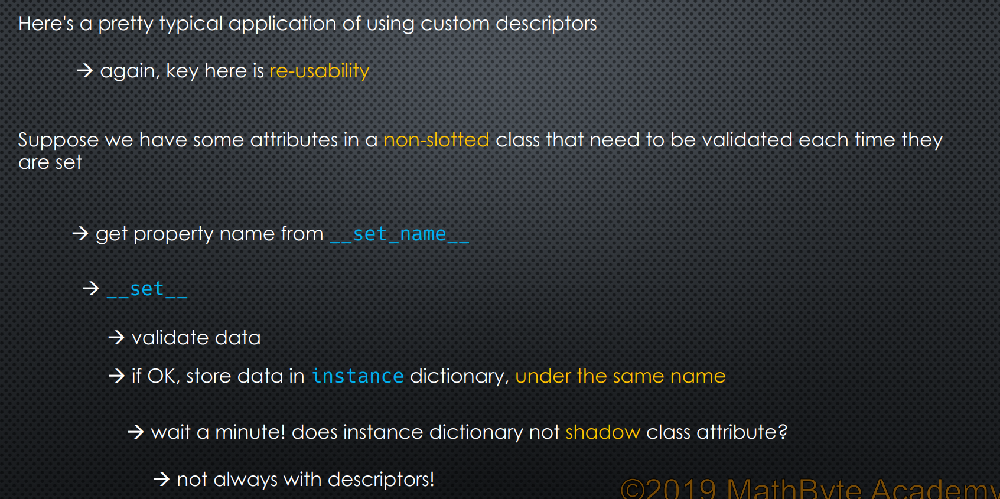

## This is the key difference between data and non-data descriptors (the shadowing!!)

`__set_name__`: recover the name of the property that the descriptor instance is being assigned to in our class

# 1. Property

In [1]:
class Person:
    
    def __init__(self,name,age):
        self._name = name
        self._age = age
        
    @property
    def age(self):
        print('getter called')
        return self._age
    
    @age.setter
    def age(self, value):
        print('setter called')
        if value<=0:
            raise Exception('Age cannot be negative')
        self._age = value

In [2]:
p = Person('Theo', 22)  # no setter called here

In [3]:
p._name

'Theo'

In [4]:
p.name

AttributeError: 'Person' object has no attribute 'name'

In [5]:
p.age

getter called


22

In [6]:
p._age

22

In [7]:
p.age = -3

setter called


Exception: Age cannot be negative

In [8]:
p._age = -3  # notice that we are NOT calling the setter here. we manipulate the _age directly

In [9]:
p.age

getter called


-3

## Problem... We are NOT using the property here...

In [10]:
p = Person('Theo', -5)

In [12]:
p._name

'Theo'

In [13]:
p.age

getter called


-5

In [14]:
class Person:
    
    def __init__(self,name,age):
        self._name = name
        
        #self._age = age
        # here is it calling the property!
        self.age = age
        
    @property
    def age(self):
        print('getter called')
        return self._age
    
    @age.setter
    def age(self, value):
        print('setter called')
        if value<=0:
            raise Exception('Age cannot be negative')
        self._age = value

In [15]:
p = Person('Georgia', 28)  # setter is called because self.age = age calls the property!

setter called


In [16]:
p.name

AttributeError: 'Person' object has no attribute 'name'

In [17]:
p._name

'Georgia'

In [18]:
p.age

getter called


28

In [19]:
p._age

28

In [20]:
p._age = 33

In [21]:
p.age

getter called


33

In [22]:
p._age

33

## We can still manipulate the _age! While we shouldnt since it is a hidden

In [23]:
p._age = -3

In [24]:
p.age

getter called


-3

In [25]:
p._age

-3

## The difference from previous case it in the instantiation

In [26]:
p = Person('Theo', -5)

setter called


Exception: Age cannot be negative

In [27]:
class Useless:
    @property
    def useless(self):
        return 'useless!'
    
    @useless.setter
    def useless(self, value):
        pass

In [29]:
o = Useless()

In [30]:
o.useless

'useless!'

In [31]:
o.__dict__ #properties are NOT stored in the instance dict!

{}

In [32]:
o.useless = 'something else'

In [33]:
o.__dict__

{}

In [34]:
o.useless

'useless!'